In [ ]:
# IMPORTS
import tensorflow as tf
from tensorflow import keras
print(tf.__version__)
import imageio
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import csv
import cv2
import os
import time
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Reshape, Conv2DTranspose, BatchNormalization, LeakyReLU
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, LeakyReLU, Conv2D
import random
import time
import json
"""
from google.colab import drive
drive.mount('/content/drive')
"""

2.9.2


"\nfrom google.colab import drive\ndrive.mount('/content/drive')\n"

In [ ]:
"""
# ALTERNATIVA 1: med2image
# modul per transformar .nii a .jpg
!pip install med2image

# Specify the .nii folder path
folder_path = "/content/drive/MyDrive/UAB/TFG/data/Task01_BrainTumour/imagesTr"
# Specify the .jpg/.png folder path
jpg_folder_path = "/content/drive/MyDrive/UAB/TFG/data/jpgs/test1"
nii_files = os.listdir(folder_path)

for nii_file in nii_files:
  nii_file_path = folder_path + '/' + nii_file
  print(nii_file_path)
  nii_file_jpg = nii_file.split('.')[0] + ".jpg"
  print(jpg_folder_path)
  print(nii_file_jpg)
  #!med2image -i $nii_file_path -d $jpg_folder_path -o $nii_file_jpg --sliceToConvert m
  for i in range(60, 101):
    !med2image -i $nii_file_path -d $jpg_folder_path -o $nii_file_jpg --sliceToConvert $i
"""

'\n# ALTERNATIVA 1: med2image\n# modul per transformar .nii a .jpg\n!pip install med2image\n\n# Specify the .nii folder path\nfolder_path = "/content/drive/MyDrive/UAB/TFG/data/Task01_BrainTumour/imagesTr"\n# Specify the .jpg/.png folder path\njpg_folder_path = "/content/drive/MyDrive/UAB/TFG/data/jpgs/test1"\nnii_files = os.listdir(folder_path)\n\nfor nii_file in nii_files:\n  nii_file_path = folder_path + \'/\' + nii_file\n  print(nii_file_path)\n  nii_file_jpg = nii_file.split(\'.\')[0] + ".jpg"\n  print(jpg_folder_path)\n  print(nii_file_jpg)\n  #!med2image -i $nii_file_path -d $jpg_folder_path -o $nii_file_jpg --sliceToConvert m\n  for i in range(60, 101):\n    !med2image -i $nii_file_path -d $jpg_folder_path -o $nii_file_jpg --sliceToConvert $i\n'

In [ ]:
"""
# GAN
jpg_folder_path = "/content/drive/MyDrive/UAB/TFG/data/jpgs/resized"
dest_folder_path = "/content/drive/MyDrive/UAB/TFG/data/jpgs/resized"

# Use os.scandir to get an iterator of the files in the directory
with os.scandir(jpg_folder_path) as it:
    jpg_files = list(it)

file_names = [x.name for x in jpg_files]

#guardar nom fitxers al drive
import json
with open("/content/drive/MyDrive/UAB/TFG/data/file_names", "w") as fp:
  json.dump(file_names, fp)
"""

'\n# GAN\njpg_folder_path = "/content/drive/MyDrive/UAB/TFG/data/jpgs/resized"\ndest_folder_path = "/content/drive/MyDrive/UAB/TFG/data/jpgs/resized"\n\n# Use os.scandir to get an iterator of the files in the directory\nwith os.scandir(jpg_folder_path) as it:\n    jpg_files = list(it)\n\nfile_names = [x.name for x in jpg_files]\n\n#guardar nom fitxers al drive\nimport json\nwith open("/content/drive/MyDrive/UAB/TFG/data/file_names", "w") as fp:\n  json.dump(file_names, fp)\n'

In [ ]:
"""
jpg_folder_path = "/content/drive/MyDrive/UAB/TFG/data/jpgs/resized"

with open("/content/drive/MyDrive/UAB/TFG/data/jpg_file_names", "r") as fp:
  jpg_files = json.load(fp)

print("Dataframe length:")
print(len(jpg_files))


files = os.listdir(jpg_folder_path)
print("directory length:")
print(len(files))

# Shuffle the list of files
random.shuffle(jpg_files)

# Pre-allocate NumPy array with correct shape
n_samples = 50000
width = 112
height = 112
dim = (width, height)
mri_images = np.empty((n_samples, height, width), dtype=np.float32)

# Read and resize the images in batches
i = 0
for jpg_file in jpg_files:
    if i == n_samples:
        break
    # Read image
    start = time.time()
    mri_image = cv2.imread(jpg_folder_path + '/' + jpg_file, 0)
    print (time.time()-start)
    # Resize image
    #mri_image_resized = cv2.resize(mri_image, dim) 
    # Store in NumPy array
    mri_images[i] = mri_image

    i += 1

with open(f'/content/drive/MyDrive/UAB/TFG/data/mri_images_{n_samples}.npy', 'wb') as f:
    np.save(f, mri_images)

print("Dataframe shape:")
mri_images.shape
"""

'\njpg_folder_path = "/content/drive/MyDrive/UAB/TFG/data/jpgs/resized"\n\nwith open("/content/drive/MyDrive/UAB/TFG/data/jpg_file_names", "r") as fp:\n  jpg_files = json.load(fp)\n\nprint("Dataframe length:")\nprint(len(jpg_files))\n\n\nfiles = os.listdir(jpg_folder_path)\nprint("directory length:")\nprint(len(files))\n\n# Shuffle the list of files\nrandom.shuffle(jpg_files)\n\n# Pre-allocate NumPy array with correct shape\nn_samples = 50000\nwidth = 112\nheight = 112\ndim = (width, height)\nmri_images = np.empty((n_samples, height, width), dtype=np.float32)\n\n# Read and resize the images in batches\ni = 0\nfor jpg_file in jpg_files:\n    if i == n_samples:\n        break\n    # Read image\n    start = time.time()\n    mri_image = cv2.imread(jpg_folder_path + \'/\' + jpg_file, 0)\n    print (time.time()-start)\n    # Resize image\n    #mri_image_resized = cv2.resize(mri_image, dim) \n    # Store in NumPy array\n    mri_images[i] = mri_image\n\n    i += 1\n\nwith open(f\'/content/driv

In [ ]:
n_samples = 50000

with open(f'/content/drive/MyDrive/UAB/TFG/data/mri_images_{n_samples}.npy', 'rb') as f:
    mri_images = np.load(f)

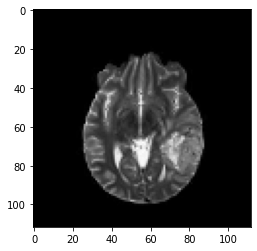

In [ ]:
plt.imshow(mri_images[0], cmap='gray')

In [ ]:
train_images = mri_images.reshape(mri_images.shape[0], 112, 112, 1).astype('float32')

train_images = (train_images - 127.5) / 127.5

BUFFER_SIZE = 6000
BATCH_SIZE = 16
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

print(train_images.shape)
print(np.min(train_images))
print(np.max(train_images))

(50000, 112, 112, 1)
-1.0
1.0


In [ ]:
"""
# 4 LAYER
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Reshape, Conv2DTranspose, LeakyReLU

def make_generator_model():
    model = Sequential()
    model.add(Dense(56*56*64, use_bias=False, input_shape=(100,)))
    model.add(LeakyReLU(alpha=0.01))
    model.add(Reshape((56, 56, 64)))
    model.add(Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', activation='tanh'))
    return model
"""

"\n# 4 LAYER\nfrom tensorflow.keras import Sequential\nfrom tensorflow.keras.layers import Dense, Reshape, Conv2DTranspose, LeakyReLU\n\ndef make_generator_model():\n    model = Sequential()\n    model.add(Dense(56*56*64, use_bias=False, input_shape=(100,)))\n    model.add(LeakyReLU(alpha=0.01))\n    model.add(Reshape((56, 56, 64)))\n    model.add(Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', activation='tanh'))\n    return model\n"

In [ ]:

# 7 LAYER
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Reshape, Conv2DTranspose, BatchNormalization, LeakyReLU

def make_generator_model():
    model = Sequential()
    model.add(Dense(28*28*256, use_bias=False, input_shape=(100,)))

    model.add(Reshape((28, 28, 256)))

    model.add(Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))

    model.add(Conv2DTranspose(64, (5, 5), strides=(1, 1), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))

    model.add(Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', activation='tanh'))

    return model
  

In [ ]:
"""
# 15 LAYER
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Reshape, Conv2DTranspose, BatchNormalization, LeakyReLU


def make_generator_model():
    model = Sequential()
    model.add(Dense(14*14*256, use_bias=False, input_shape=(100,)))

    model.add(Reshape((14, 14, 256)))

    model.add(Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))

    model.add(Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))

    model.add(Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))

    model.add(Conv2DTranspose(64, (5, 5), strides=(1, 1), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))

    model.add(Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', activation='tanh'))

    return model
"""

"\n# 15 LAYER\nfrom tensorflow.keras import Sequential\nfrom tensorflow.keras.layers import Dense, Reshape, Conv2DTranspose, BatchNormalization, LeakyReLU\n\n\ndef make_generator_model():\n    model = Sequential()\n    model.add(Dense(14*14*256, use_bias=False, input_shape=(100,)))\n\n    model.add(Reshape((14, 14, 256)))\n\n    model.add(Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same'))\n    model.add(BatchNormalization())\n    model.add(LeakyReLU(alpha=0.01))\n\n    model.add(Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same'))\n    model.add(BatchNormalization())\n    model.add(LeakyReLU(alpha=0.01))\n\n    model.add(Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same'))\n    model.add(BatchNormalization())\n    model.add(LeakyReLU(alpha=0.01))\n\n    model.add(Conv2DTranspose(64, (5, 5), strides=(1, 1), padding='same'))\n    model.add(BatchNormalization())\n    model.add(LeakyReLU(alpha=0.01))\n\n    model.add(Conv2DTranspose(1, (5, 5), strides=(2, 2), p

In [ ]:
generator = make_generator_model()
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 200704)            20070400  
                                                                 
 reshape (Reshape)           (None, 28, 28, 256)       0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 56, 56, 128)      819328    
 nspose)                                                         
                                                                 
 batch_normalization (BatchN  (None, 56, 56, 128)      512       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 56, 56, 128)       0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 56, 56, 64)       2

(1, 112, 112, 1)


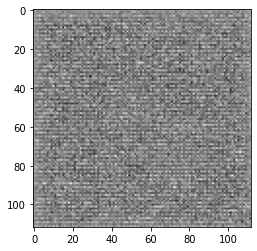

In [ ]:
noise_dim = 100
noise = tf.random.normal([1, noise_dim])
generated_image = generator(noise, training=False)

print(generated_image.shape)

plt.imshow(generated_image[0, :, :, 0], cmap='gray')

In [ ]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, LeakyReLU, Conv2D

def make_discriminator_model():
    model = Sequential()
    model.add(Conv2D(32, (5, 5), strides=(2, 2), padding='same',
                                   input_shape=[112, 112, 1]))
    model.add(LeakyReLU(alpha=0.01))

    model.add(Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))

    model.add(Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))

    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

In [ ]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print(decision)

discriminator.summary()

tf.Tensor([[0.4998689]], shape=(1, 1), dtype=float32)
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 56, 56, 32)        832       
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 56, 56, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 28, 28, 64)        51264     
                                                                 
 batch_normalization_2 (Batc  (None, 28, 28, 64)       256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 28, 28, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 14, 14, 128)       204928    


In [ ]:
train_images.shape

(50000, 112, 112, 1)

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [ ]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)

discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [ ]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

In [ ]:
grid_size_x= 10
grid_size_y= 10
seed = tf.random.normal([grid_size_x*grid_size_y , noise_dim])

def train(dataset, epochs):
  # arrays to save model's loss
  gen_loss_array = np.zeros([epochs], dtype=float)
  disc_loss_array = np.zeros([epochs], dtype=float)

  gen_aux = np.zeros([len(dataset)], dtype=float)
  disc_aux = np.zeros([len(dataset)], dtype=float)

  for epoch in range(epochs):
    start = time.time()

    i = 0
    for image_batch in dataset:

      gen_loss, disc_loss = train_step(image_batch)
      
      gen_aux[i] = gen_loss.numpy()
      disc_aux[i] = disc_loss.numpy()

      i += 1

    generate_images(generator, seed)
    print("Generator loss: ")
    gen_loss_array[epoch] = np.average(gen_aux)
    print(gen_loss_array[epoch])

    print("Discriminator loss: ")
    disc_loss_array[epoch] = np.average(disc_aux)
    print(disc_loss_array[epoch])

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  generate_images(generator, seed)

  return gen_loss_array, disc_loss_array

In [ ]:
def generate_images(model, test_input):

  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(grid_size_x,grid_size_y))
  for i in range(predictions.shape[0]):
      plt.subplot(grid_size_x, grid_size_y, i+1)
      plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
      plt.axis('off')
  
  plt.show()

SAMPLES: 50000
EPOCHS: 50


/usr/local/lib/python3.8/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


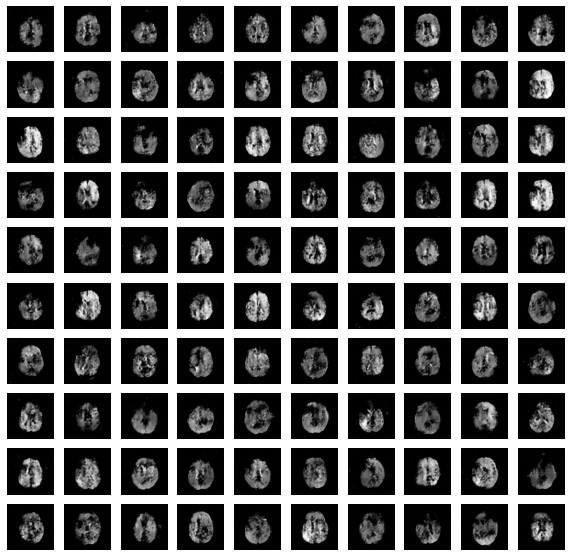

Generator loss: 
1.4505204788303376
Discriminator loss: 
1.1594907361385227
Time for epoch 1 is 155.9189772605896 sec


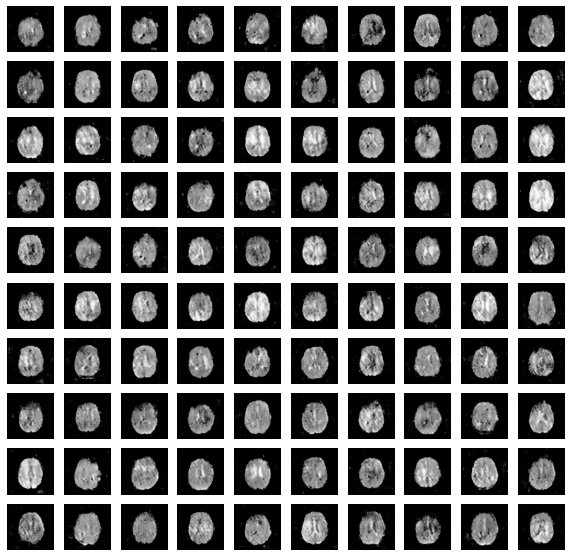

Generator loss: 
0.9119582443928719
Discriminator loss: 
1.3403248832416534
Time for epoch 2 is 155.22351551055908 sec


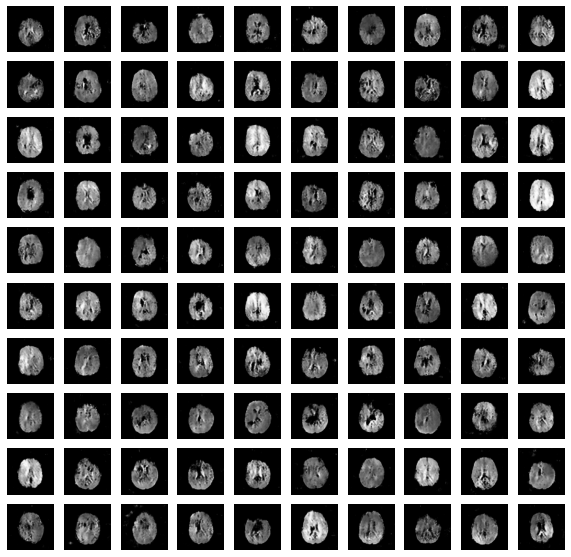

Generator loss: 
1.0479372773075104
Discriminator loss: 
1.252050881356001
Time for epoch 3 is 155.21910333633423 sec


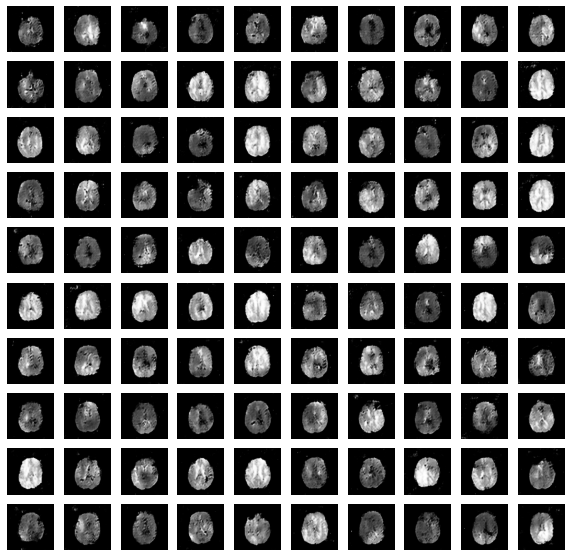

Generator loss: 
1.0976422182869912
Discriminator loss: 
1.2337666494727135
Time for epoch 4 is 155.02418661117554 sec


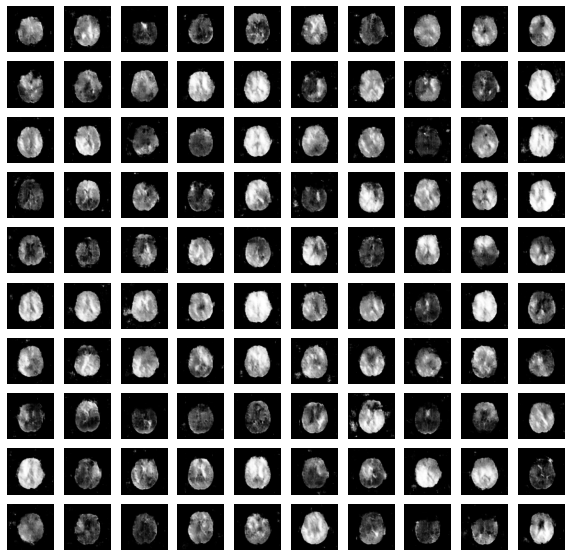

Generator loss: 
0.9930921557641029
Discriminator loss: 
1.2972134883022308
Time for epoch 5 is 155.00441360473633 sec


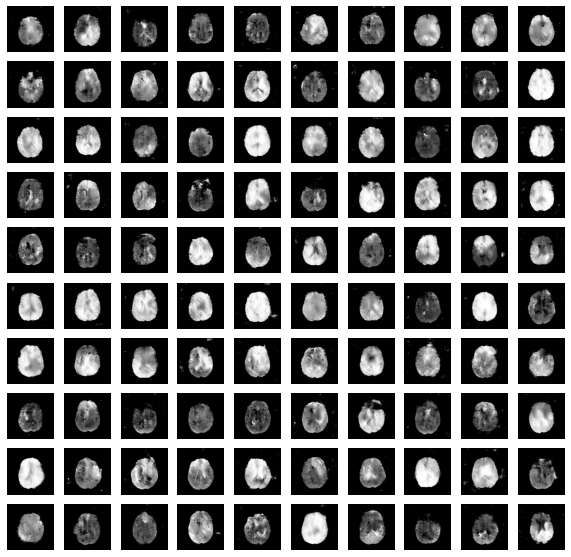

Generator loss: 
1.054457738685608
Discriminator loss: 
1.260137198548317
Time for epoch 6 is 154.90756487846375 sec


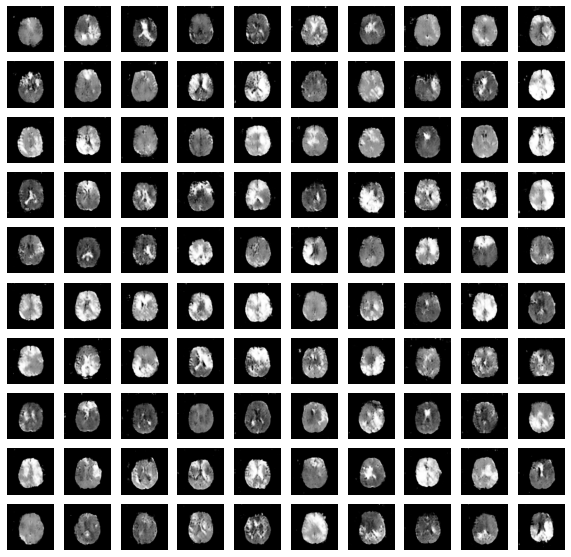

Generator loss: 
1.008995133485794
Discriminator loss: 
1.2797388961434364
Time for epoch 7 is 155.09777402877808 sec


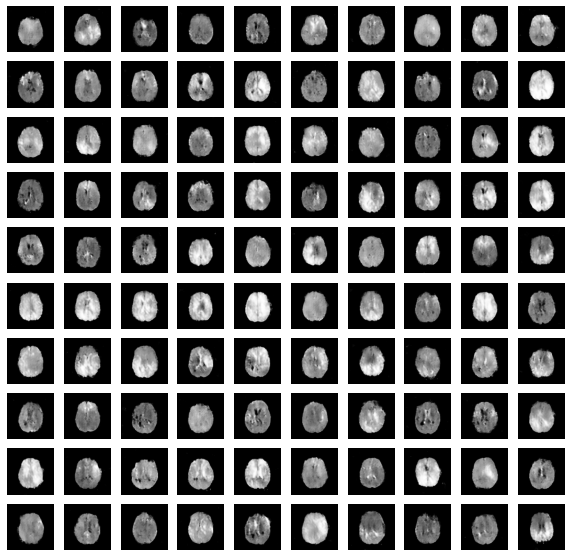

Generator loss: 
1.0022353017318248
Discriminator loss: 
1.2815165143299103
Time for epoch 8 is 155.00075268745422 sec


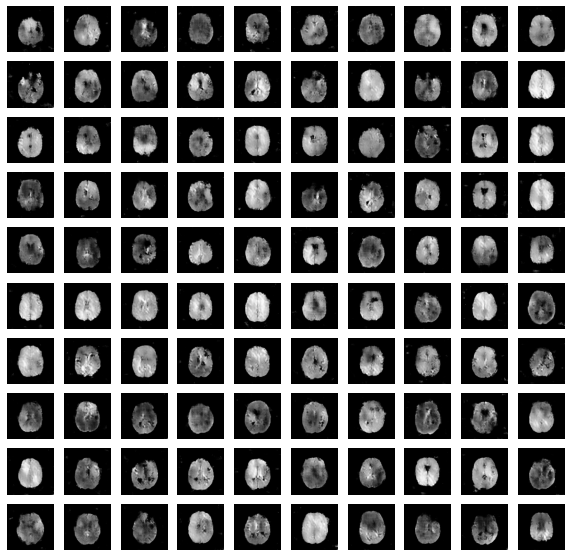

Generator loss: 
1.0261525537109375
Discriminator loss: 
1.2708160801410675
Time for epoch 9 is 155.22670912742615 sec


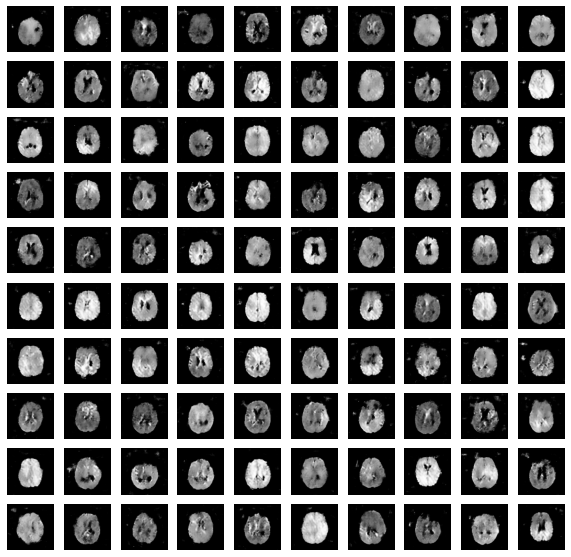

Generator loss: 
0.9508464676523208
Discriminator loss: 
1.3356170048713685
Time for epoch 10 is 154.78958797454834 sec


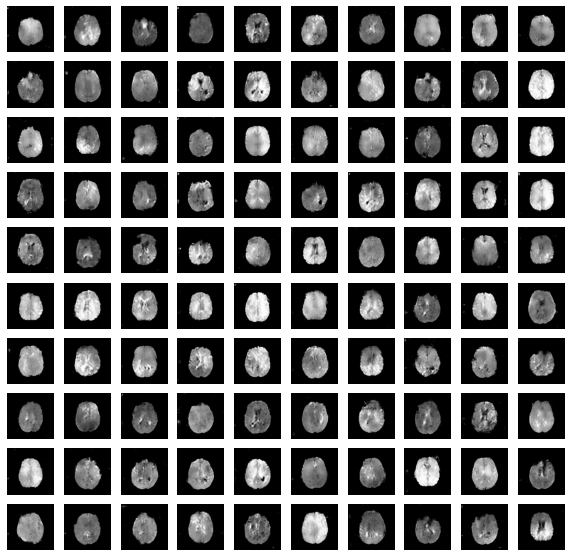

Generator loss: 
1.0138941633546352
Discriminator loss: 
1.2970511886644362
Time for epoch 11 is 155.1022870540619 sec


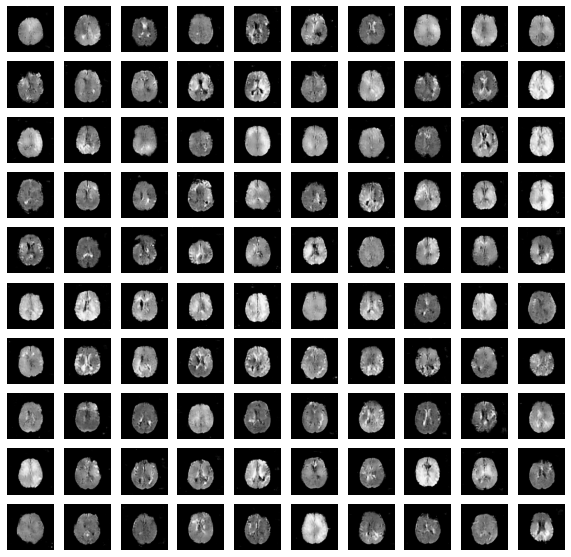

Generator loss: 
0.8861208957362176
Discriminator loss: 
1.3764992355537415
Time for epoch 12 is 154.97654366493225 sec


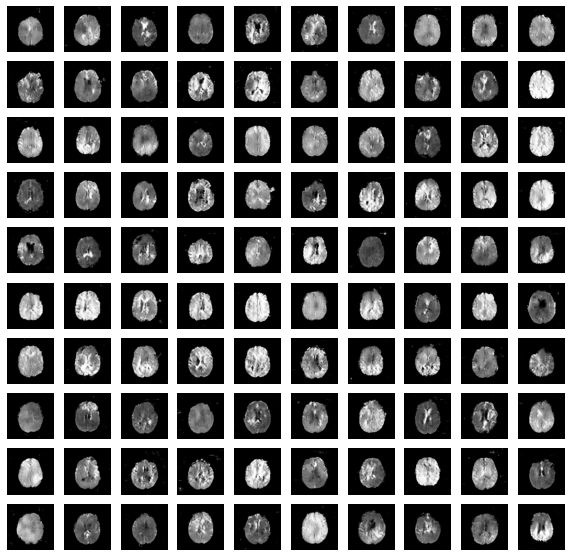

Generator loss: 
0.872555774974823
Discriminator loss: 
1.3660283874893189
Time for epoch 13 is 154.9054729938507 sec


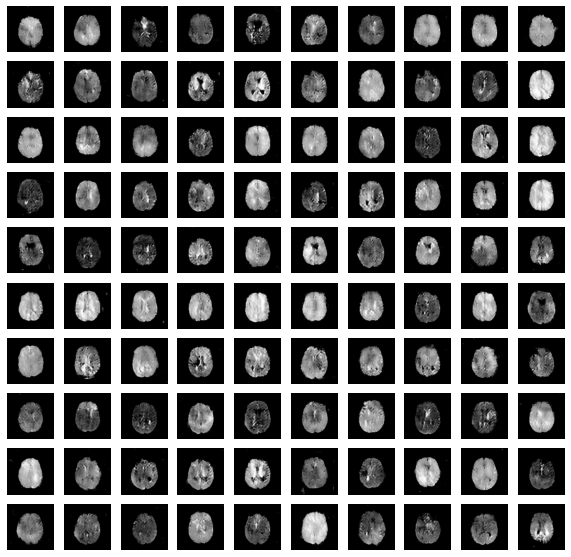

Generator loss: 
0.8750637122893333
Discriminator loss: 
1.3896141303825378
Time for epoch 14 is 154.86116433143616 sec


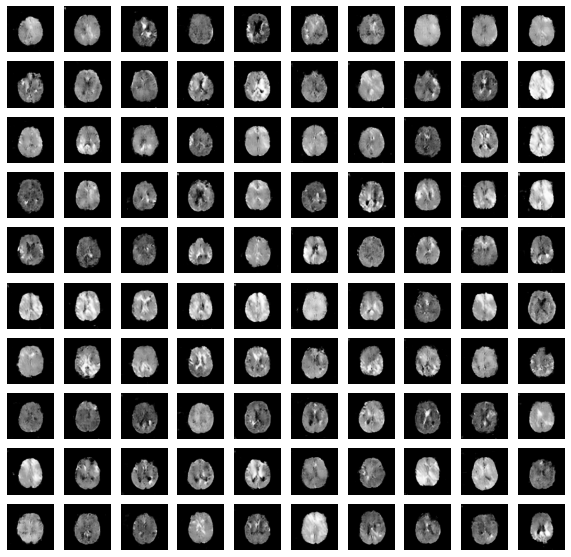

Generator loss: 
0.9088197508609295
Discriminator loss: 
1.3641731805086137
Time for epoch 15 is 154.66584515571594 sec


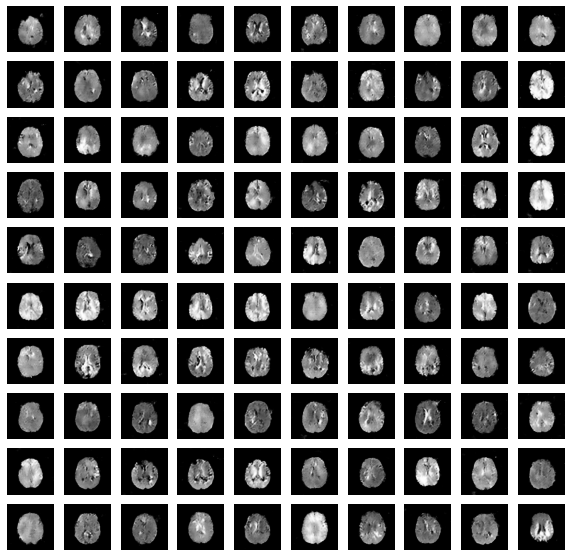

Generator loss: 
0.9458844794011116
Discriminator loss: 
1.3107884735250472
Time for epoch 16 is 154.94111132621765 sec


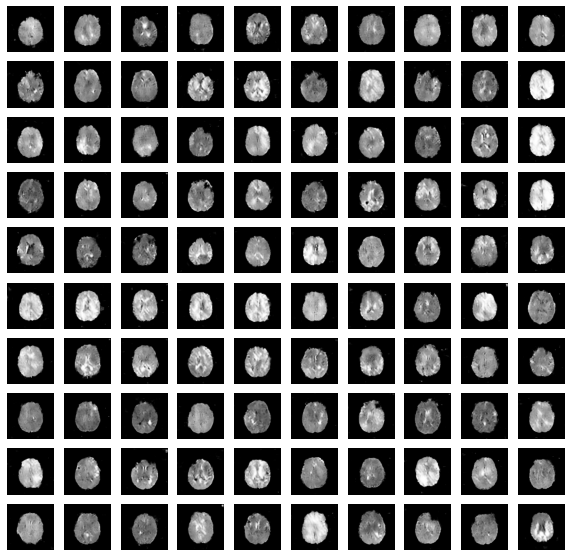

Generator loss: 
0.8758934948825836
Discriminator loss: 
1.370792957048416
Time for epoch 17 is 154.68312859535217 sec


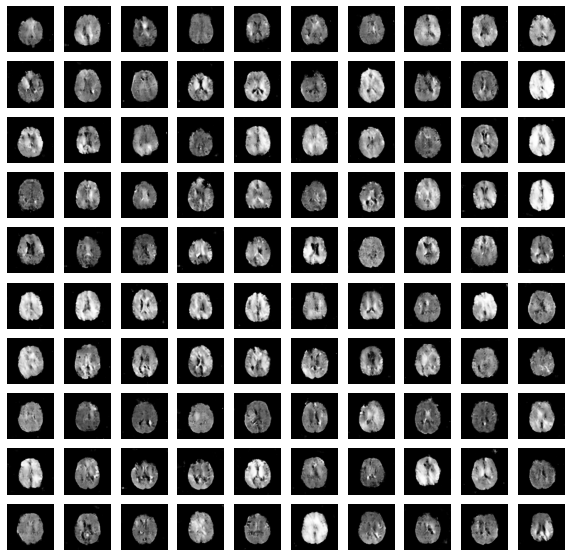

Generator loss: 
0.8300725483703614
Discriminator loss: 
1.4024074268531799
Time for epoch 18 is 154.82229161262512 sec


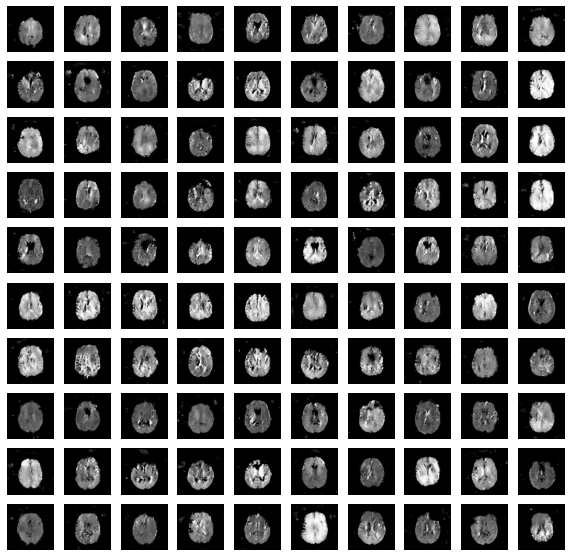

Generator loss: 
0.8578639926338196
Discriminator loss: 
1.3797366008758545
Time for epoch 19 is 154.79183626174927 sec


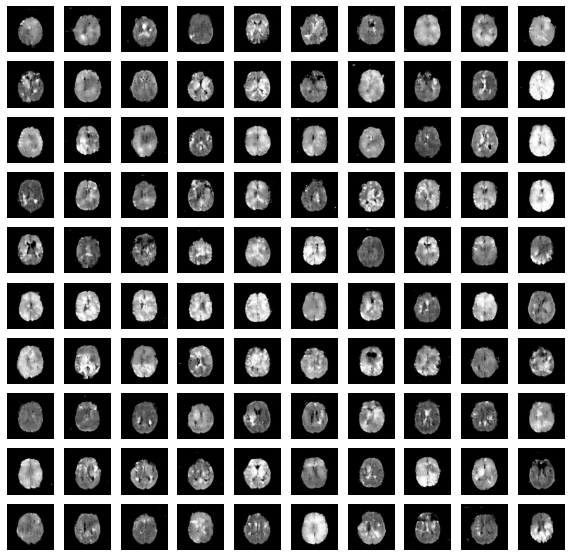

Generator loss: 
0.8641514922451973
Discriminator loss: 
1.3602731853103638
Time for epoch 20 is 154.7809386253357 sec


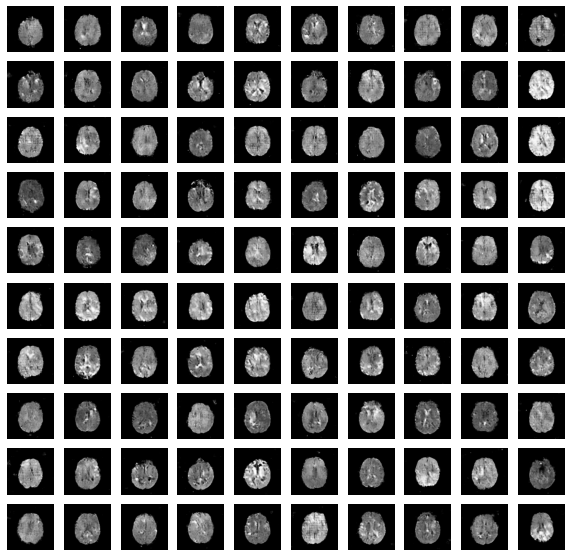

Generator loss: 
0.8685460424995423
Discriminator loss: 
1.3752547637081147
Time for epoch 21 is 154.828768491745 sec


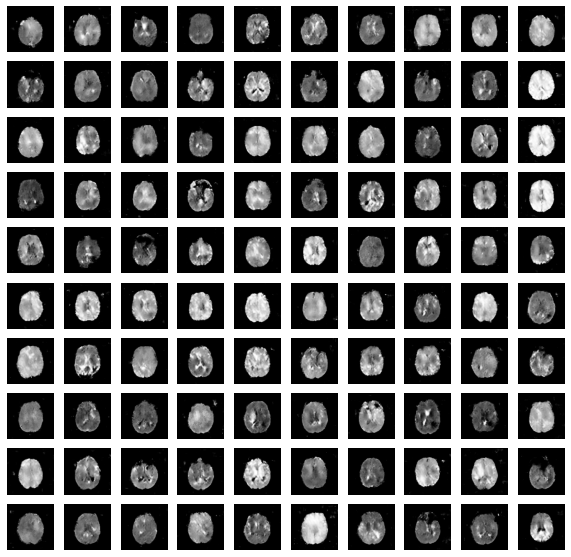

Generator loss: 
0.8093096862745285
Discriminator loss: 
1.409393249578476
Time for epoch 22 is 154.77604937553406 sec


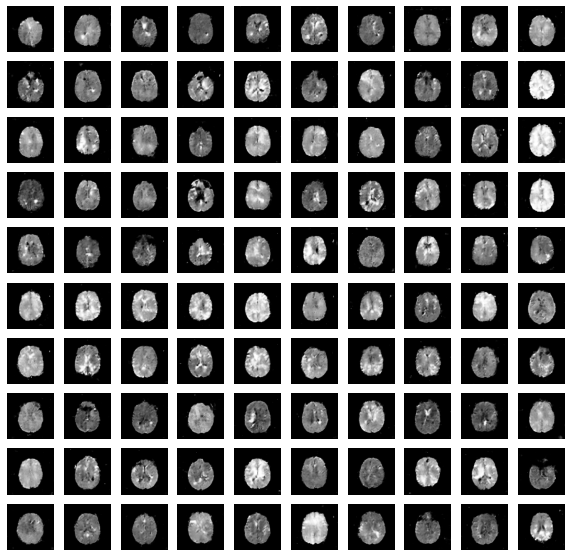

Generator loss: 
0.8443499951648712
Discriminator loss: 
1.3801590213489532
Time for epoch 23 is 155.00325179100037 sec


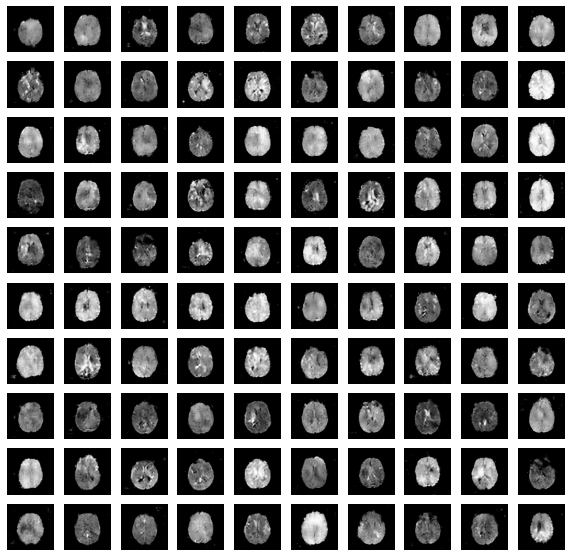

Generator loss: 
0.8992565279507637
Discriminator loss: 
1.4254789950180053
Time for epoch 24 is 154.5976345539093 sec


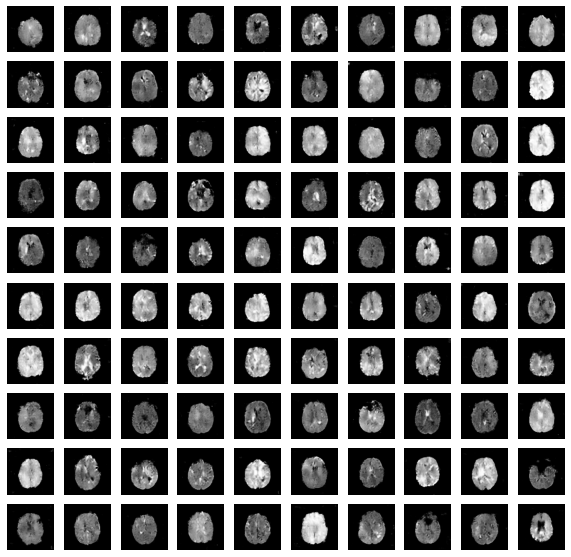

Generator loss: 
0.7961834438252449
Discriminator loss: 
1.4199527151489257
Time for epoch 25 is 154.97964000701904 sec


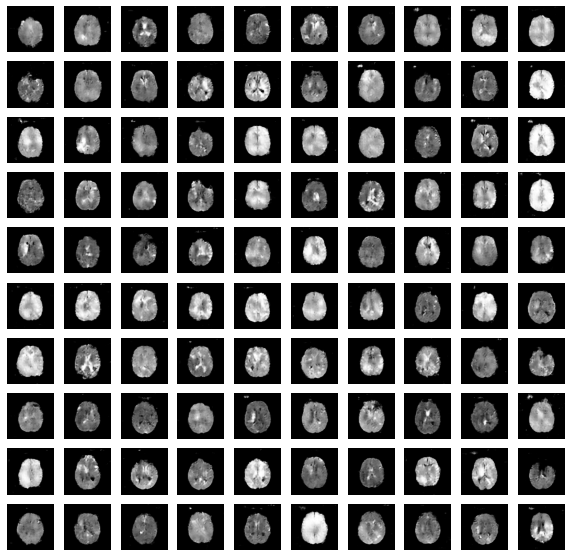

Generator loss: 
0.8194850816297531
Discriminator loss: 
1.4002783003616333
Time for epoch 26 is 154.8080461025238 sec


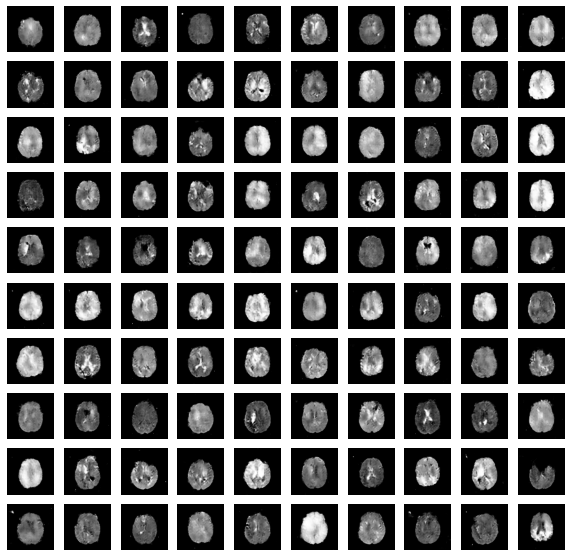

Generator loss: 
0.814667666401863
Discriminator loss: 
1.3999079131126404
Time for epoch 27 is 154.77882838249207 sec


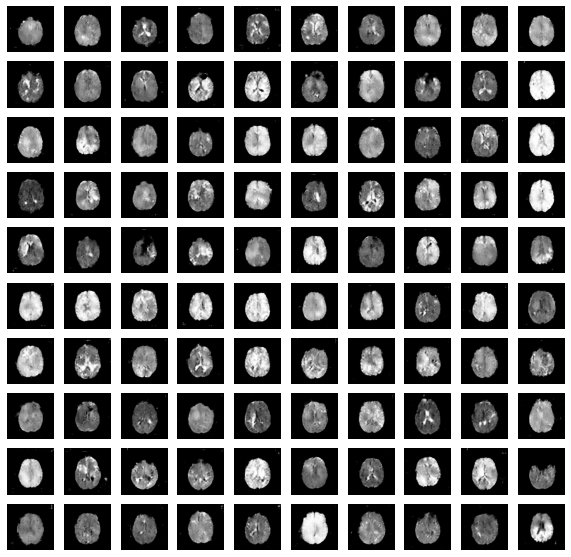

Generator loss: 
0.8092765921235084
Discriminator loss: 
1.4116318417739868
Time for epoch 28 is 154.90240788459778 sec


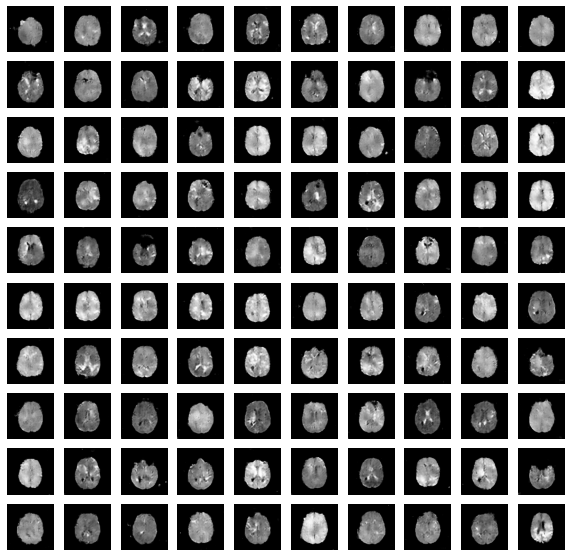

Generator loss: 
0.7959993146848678
Discriminator loss: 
1.4028752516937255
Time for epoch 29 is 154.6757845878601 sec


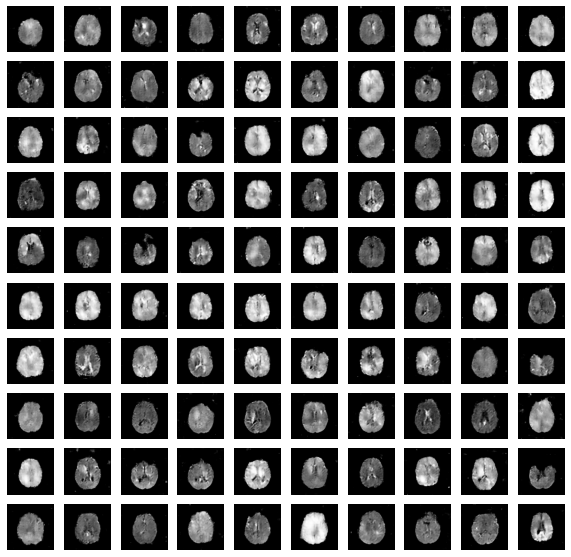

Generator loss: 
0.7826773486834765
Discriminator loss: 
1.4113913307476045
Time for epoch 30 is 154.64580488204956 sec


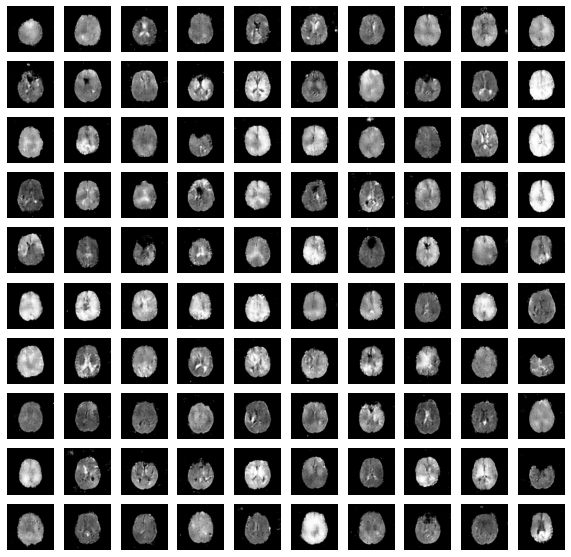

Generator loss: 
0.79940585811615
Discriminator loss: 
1.4087732107925415
Time for epoch 31 is 154.68901085853577 sec


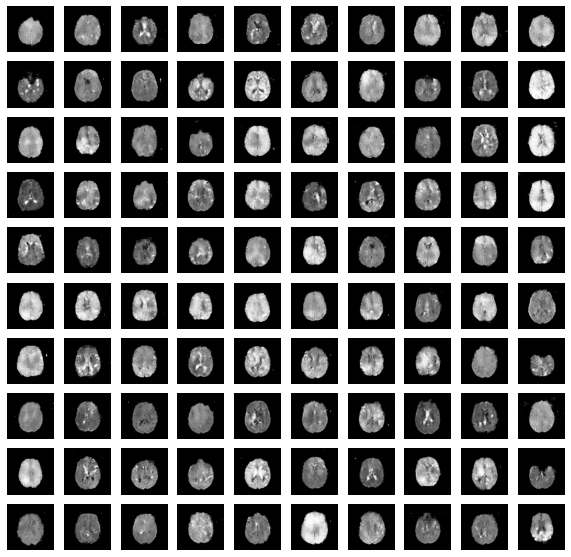

Generator loss: 
0.807168772406578
Discriminator loss: 
1.409952479953766
Time for epoch 32 is 154.95579433441162 sec


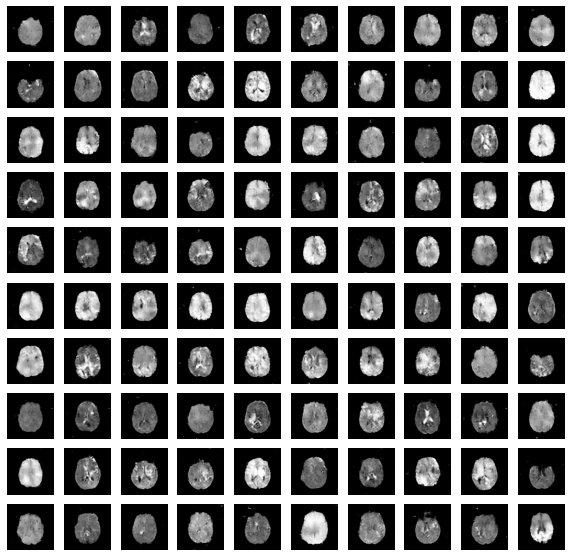

Generator loss: 
0.792606376452446
Discriminator loss: 
1.4115584532737733
Time for epoch 33 is 154.81583952903748 sec


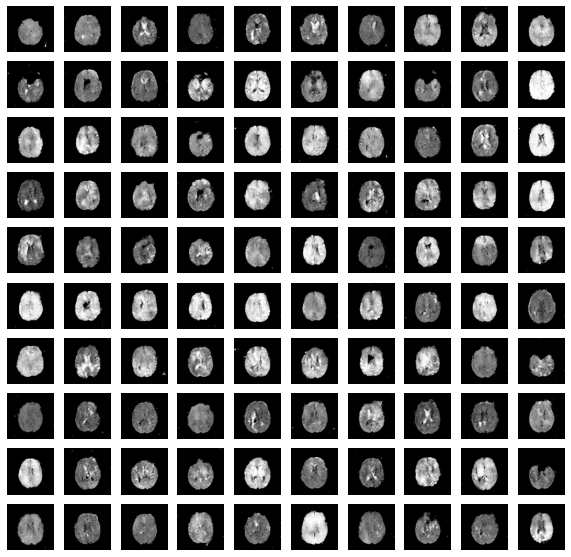

Generator loss: 
0.7774492633152008
Discriminator loss: 
1.4451507975959779
Time for epoch 34 is 154.66799688339233 sec


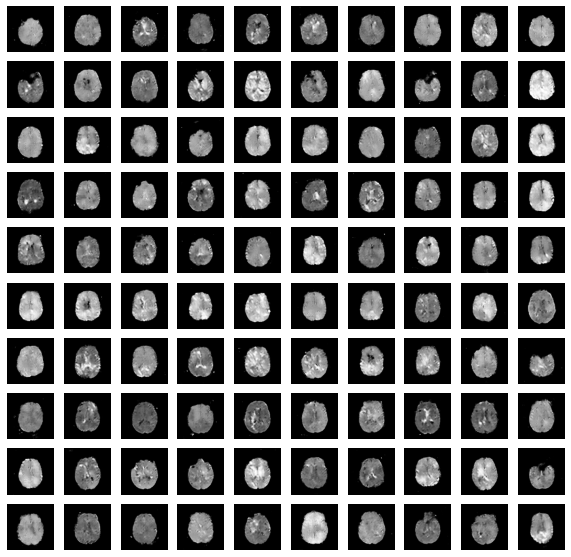

Generator loss: 
0.8019558472537994
Discriminator loss: 
1.4116057964134217
Time for epoch 35 is 154.8074152469635 sec


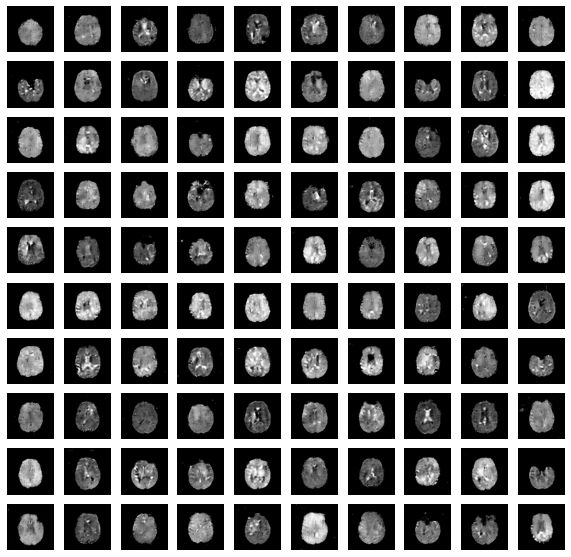

Generator loss: 
0.7844068024206161
Discriminator loss: 
1.4246939392471314
Time for epoch 36 is 154.76653742790222 sec


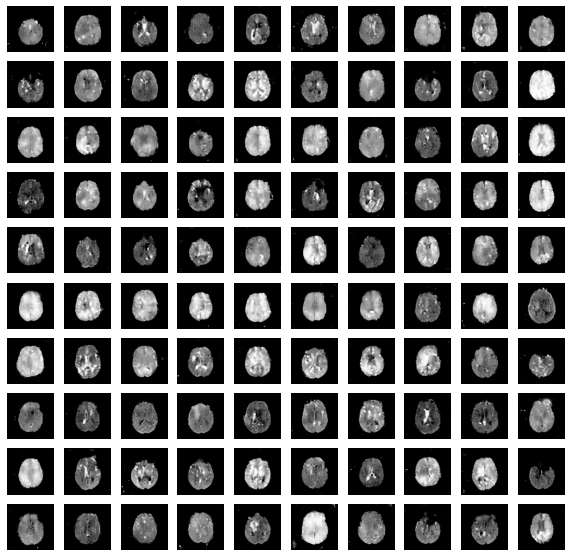

Generator loss: 
0.772971456656456
Discriminator loss: 
1.4050327688217163
Time for epoch 37 is 154.91111183166504 sec


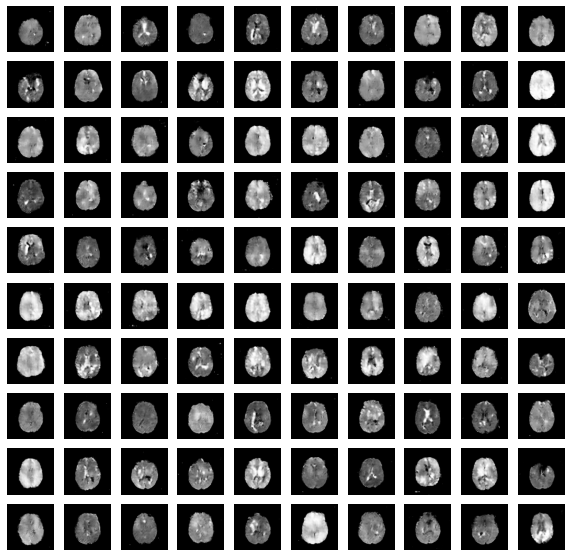

Generator loss: 
0.7673700596904754
Discriminator loss: 
1.4346632223892213
Time for epoch 38 is 154.785964012146 sec


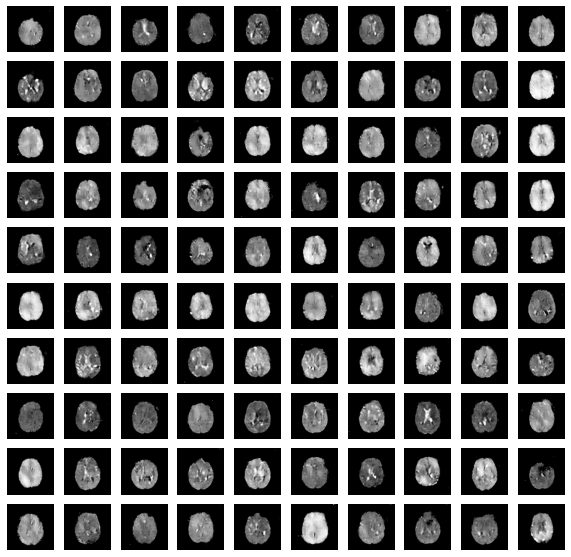

Generator loss: 
0.7553957820987701
Discriminator loss: 
1.4253327901268005
Time for epoch 39 is 154.72833275794983 sec


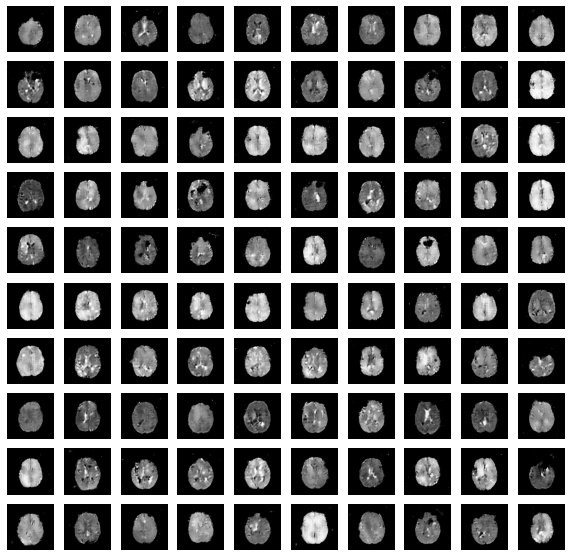

Generator loss: 
0.759077608575821
Discriminator loss: 
1.4142705171585084
Time for epoch 40 is 154.89908814430237 sec


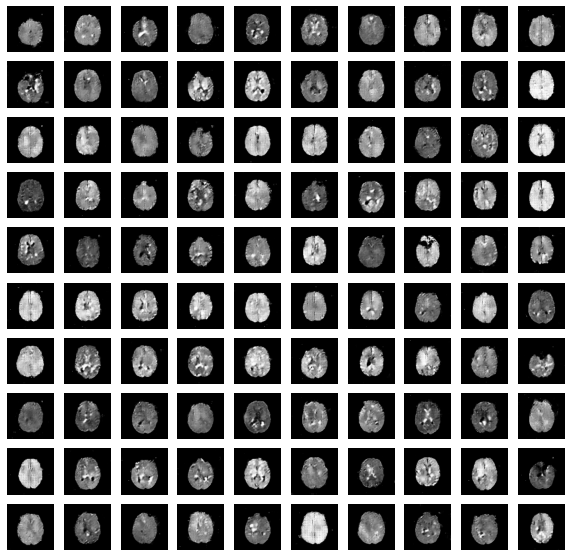

Generator loss: 
0.7756174290657043
Discriminator loss: 
1.4190144354629517
Time for epoch 41 is 154.6644742488861 sec


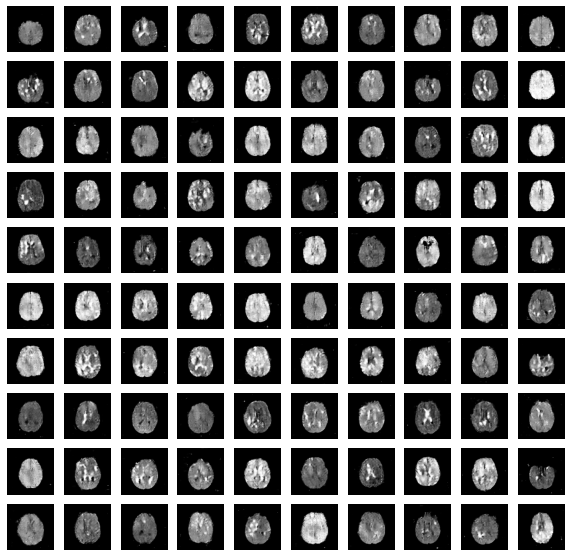

Generator loss: 
0.7634429350185394
Discriminator loss: 
1.4135683403873445
Time for epoch 42 is 154.70513916015625 sec


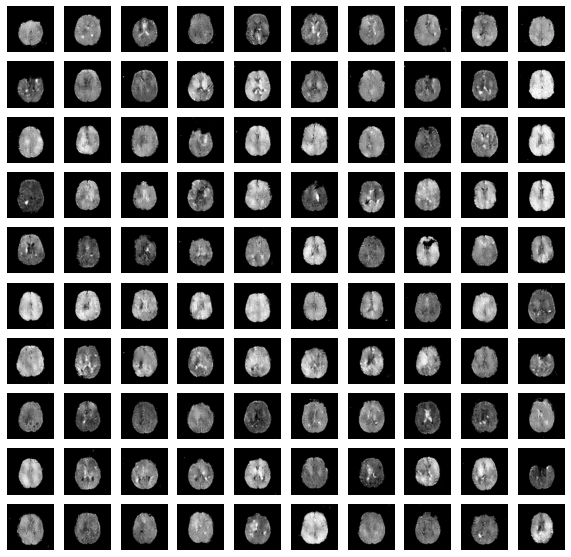

Generator loss: 
0.7567075469923019
Discriminator loss: 
1.4260337108039856
Time for epoch 43 is 154.8284251689911 sec


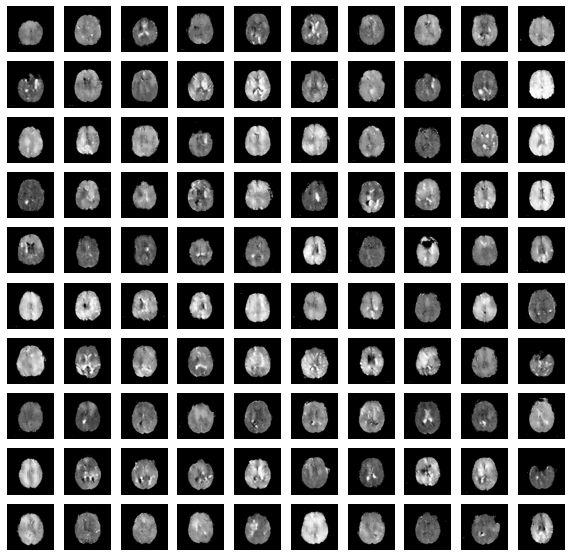

Generator loss: 
0.7755830149698257
Discriminator loss: 
1.4046821486282348
Time for epoch 44 is 154.76616263389587 sec


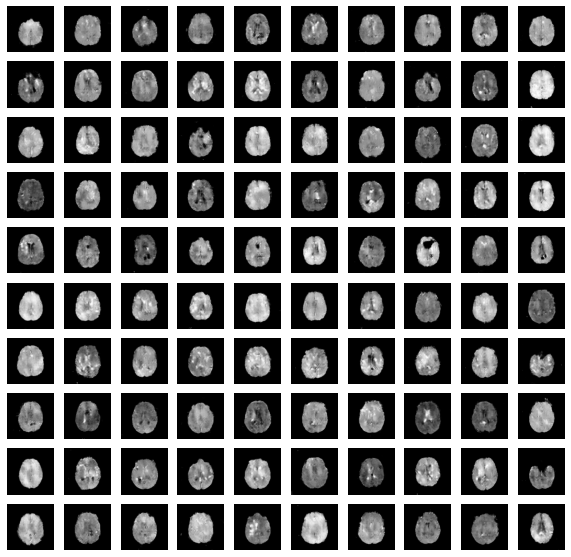

Generator loss: 
0.7517586672163009
Discriminator loss: 
1.4221273407173156
Time for epoch 45 is 154.5639853477478 sec


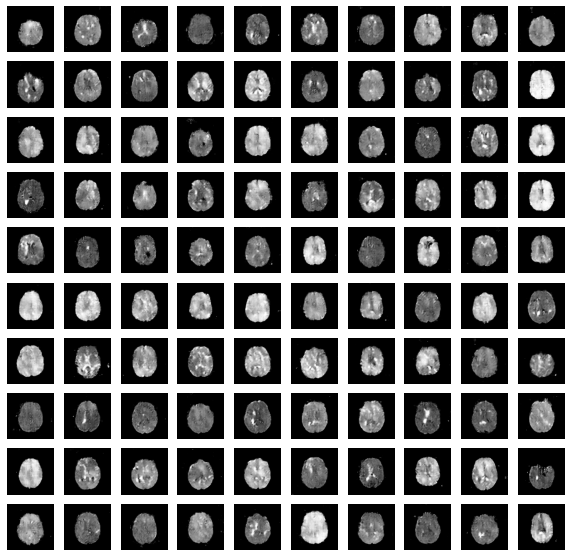

Generator loss: 
0.7673212339639663
Discriminator loss: 
1.410119503211975
Time for epoch 46 is 154.94540929794312 sec


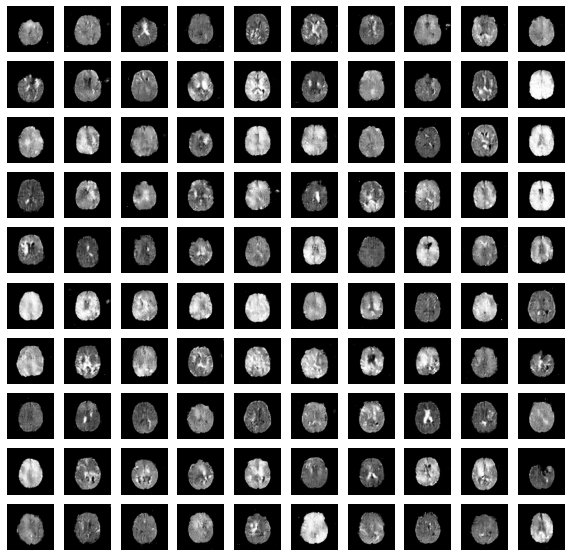

Generator loss: 
0.7517490104198455
Discriminator loss: 
1.43100723072052
Time for epoch 47 is 154.63983011245728 sec


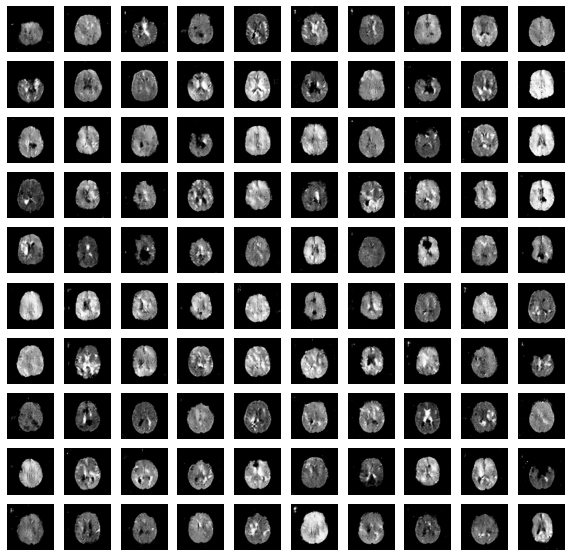

Generator loss: 
0.7532811612939835
Discriminator loss: 
1.4113871244049072
Time for epoch 48 is 154.5984263420105 sec


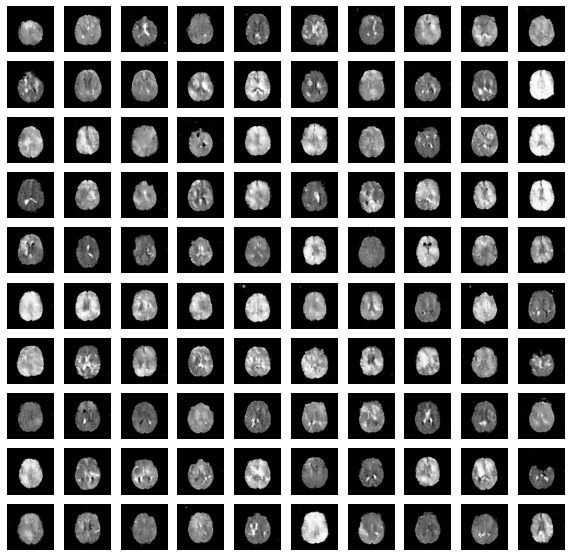

Generator loss: 
0.7469409248781205
Discriminator loss: 
1.4119996101379395
Time for epoch 49 is 154.65632438659668 sec


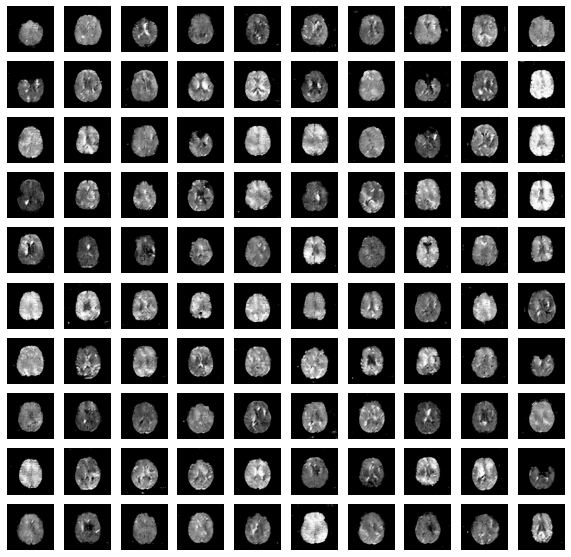

Generator loss: 
0.7860266450548172
Discriminator loss: 
1.380075383014679
Time for epoch 50 is 154.48175191879272 sec


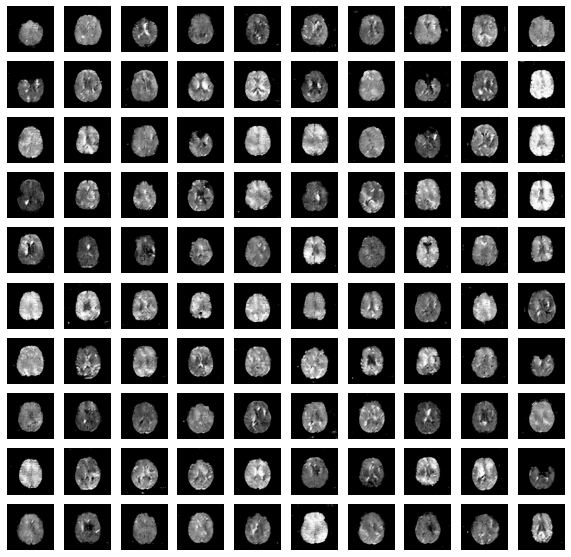

In [ ]:
EPOCHS = 50
print(f'SAMPLES: {n_samples}')
print(f'EPOCHS: {EPOCHS}')
gen_loss_array, disc_loss_array = train(train_dataset, EPOCHS)

In [ ]:
# SAVE MODEL

generator.save(f'/content/drive/MyDrive/UAB/TFG/models/generator_millorada-{n_samples}samples-{EPOCHS}epochs')
discriminator.save(f'/content/drive/MyDrive/UAB/TFG/models/discriminator_millorada-{n_samples}samples-{EPOCHS}epochs')
f'/content/drive/MyDrive/UAB/TFG/models/generator_menys-{n_samples}samples-{EPOCHS}epochs'


'/content/drive/MyDrive/UAB/TFG/models/generator_menys-50000samples-50epochs'

In [ ]:
from keras.applications.inception_v3 import preprocess_input

grid_size_x= 10
grid_size_y= 10
seed = tf.random.normal([grid_size_x*grid_size_y, noise_dim])

n = grid_size_x*grid_size_y

generated_images = generator(seed, training=False)
print(generated_images.shape)
generated_images = generated_images.numpy().reshape((n, 112, 112, 1))
generated_images = generated_images.astype('float32')
generated_images = preprocess_input(generated_images)
print(generated_images.shape)

real_images = mri_images[0:n].reshape((n, 112, 112, 1))
real_images = real_images.astype('float32')
real_images = preprocess_input(real_images)
real_images.shape

(100, 112, 112, 1)
(100, 112, 112, 1)


(100, 112, 112, 1)

In [ ]:
# frechet inception distance with ONE image
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy.random import random
from scipy.linalg import sqrtm
 
# calculate frechet inception distance
def calculate_fid(act1, act2):
 # calculate mean and covariance statistics
 mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
 mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
 # calculate sum squared difference between means
 ssdiff = np.sum((mu1 - mu2)**2.0)
 # calculate sqrt of product between cov
 covmean = sqrtm(sigma1.dot(sigma2))
 # check and correct imaginary numbers from sqrt
 if iscomplexobj(covmean):
  covmean = covmean.real
 # calculate score
 fid = ssdiff + trace(sigma1 + sigma2 - 2.0 * covmean)
 return fid
 
# define two collections of activations
act1 = random(10*2048)
act1 = act1.reshape((10,2048))
act2 = random(10*2048)
act2 = act2.reshape((10,2048))
# fid between act1 and act1
fid = calculate_fid(act1, act1)
print('FID (same): %.3f' % fid)
# fid between act1 and act2
fid = calculate_fid(act1, act2)
print('FID (different): %.3f' % fid)

FID (same): -0.000
FID (different): 359.275


In [ ]:
fid = calculate_fid(real_images[0, :, :, 0], generated_images[0, :, :, 0])
fid

18.66792104367801

In [33]:
fids = np.zeros([n*n], dtype=float)
f = 0

for i, real_image in enumerate(real_images):
  for j, genereated_image in enumerate(generated_images):
    fids[f] = calculate_fid(real_images[i, :, :, 0], generated_images[j, :, :, 0])
    
    f += 1

print(f'Samples: {n_samples}')
print(f'Epochs: {EPOCHS}')
fids = fids[~np.isnan(fids)]
print(f'FID: {np.average(fids)}')

Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to find a square root.
Failed to 

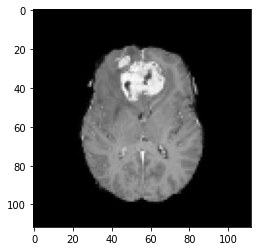

In [ ]:
plt.imshow(real_images[59, :, :, 0], cmap='gray')

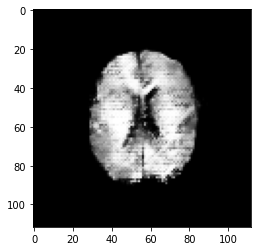

In [35]:
plt.imshow(generated_images[4, :, :, 0], cmap='gray')

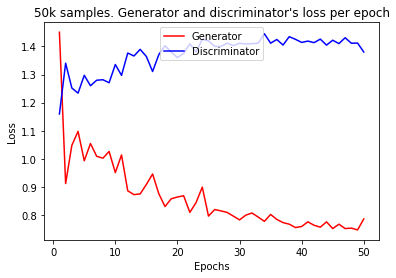

In [ ]:
plt.title(f"{int(n_samples/1000)}k samples. Generator and discriminator's loss per epoch")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.plot(range(1, EPOCHS + 1), gen_loss_array, color ="red", label='Generator')
plt.plot(range(1, EPOCHS + 1), disc_loss_array, color ="blue", label='Discriminator')
leg = plt.legend(loc='upper center')
plt.show()

In [ ]:
# LOAD MODEL

n_samples = 50000
EPOCHS = 100
noise_dim = 100
grid_size_x= 10
grid_size_y= 10
seed = tf.random.normal([grid_size_x*grid_size_y , noise_dim])

generator = keras.models.load_model(f'/content/drive/MyDrive/UAB/TFG/models/generator_menys-{n_samples}samples-{EPOCHS}epochs')
discriminator = keras.models.load_model(f'/content/drive/MyDrive/UAB/TFG/models/discriminator_menys-{n_samples}samples-{EPOCHS}epochs')

# generated_images = generator(seed, training=False)
# plt.imshow(generated_images[4, :, :, 0], cmap='gray')
